## Part 1 - VAD Training

In this part we obtain the data by extracting the audio from the target video file.

We need to make sure the file is also a wav file, which is the preferred format.

We need to apply a Voice-Activity-Detection (VAD) function that will help to create audio chunks, from where we will need to register the speaker and create the target classes for identification (Part 2).

These chunks will also be used later to obtain the transcription.

In [1]:
import pandas as pd
import numpy as np
import os
import joblib

import sktools
import importlib
import capstone

import IPython.display

import matplotlib.pyplot as plt
import seaborn as sns

import librosa

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings("ignore")


### Load Sources

In [2]:
sources = 'data/VAD/training_set/1m_snippets'
path = 'data/VAD/training_set/1m_snippets/brad_1.wav'
cwd = '/'.join(path.split('/')[0:4]) + '/'
path_list = [os.path.join(sources,fname) for fname in
               os.listdir(sources) if fname.endswith('.wav')] 

In [3]:
#obtain file pointers
file_dict = {}
for x in range(len(path_list)):
    file_dict[f"{path_list[x].split('/')[4].split('.')[0]}"] = path_list[x]
file_dict

{'edelman_4': 'data/VAD/training_set/1m_snippets/edelman_4.wav',
 'SCM2_1': 'data/VAD/training_set/1m_snippets/SCM2_1.wav',
 'SCM_1': 'data/VAD/training_set/1m_snippets/SCM_1.wav',
 'edelman_5': 'data/VAD/training_set/1m_snippets/edelman_5.wav',
 'SCM2_2': 'data/VAD/training_set/1m_snippets/SCM2_2.wav',
 'SCM_2': 'data/VAD/training_set/1m_snippets/SCM_2.wav',
 'edelman_2(music)': 'data/VAD/training_set/1m_snippets/edelman_2(music).wav',
 'edelman_1': 'data/VAD/training_set/1m_snippets/edelman_1.wav',
 'edelman_3(music)': 'data/VAD/training_set/1m_snippets/edelman_3(music).wav',
 'brad_1': 'data/VAD/training_set/1m_snippets/brad_1.wav',
 'iconic_1': 'data/VAD/training_set/1m_snippets/iconic_1.wav',
 'geoff_1': 'data/VAD/training_set/1m_snippets/geoff_1.wav'}

In [4]:
filenames = list(file_dict.keys())
print(filenames)

['edelman_4', 'SCM2_1', 'SCM_1', 'edelman_5', 'SCM2_2', 'SCM_2', 'edelman_2(music)', 'edelman_1', 'edelman_3(music)', 'brad_1', 'iconic_1', 'geoff_1']


### Feature Extraction

In [5]:
%%time
#Dictionarise features per file
for file in filenames:
    globals()[f'{file}'] = capstone.audio.feat_ext(file_dict[file], sr=16000)
    globals()[f'{file}']['path'] = file_dict[file]
    capstone.utils.print_shape(file,globals()[f'{file}'])

edelman_4 - audio     -->  (930290,)
edelman_4 - stft      -->  (1025, 12404)
edelman_4 - S         -->  (1025, 12404)
edelman_4 - energy    -->  (128, 1817)
edelman_4 - rms       -->  (1, 1817)
edelman_4 - mfcc      -->  (15, 1817)
edelman_4 - dmfcc     -->  (15, 1817)
edelman_4 - ddmfcc    -->  (15, 1817)
edelman_4 - contrast  -->  (7, 1817)
edelman_4 - centroid  -->  (1, 1817)


SCM2_1 - audio     -->  (948857,)
SCM2_1 - stft      -->  (1025, 12652)
SCM2_1 - S         -->  (1025, 12652)
SCM2_1 - energy    -->  (128, 1854)
SCM2_1 - rms       -->  (1, 1854)
SCM2_1 - mfcc      -->  (15, 1854)
SCM2_1 - dmfcc     -->  (15, 1854)
SCM2_1 - ddmfcc    -->  (15, 1854)
SCM2_1 - contrast  -->  (7, 1854)
SCM2_1 - centroid  -->  (1, 1854)


SCM_1 - audio     -->  (938008,)
SCM_1 - stft      -->  (1025, 12507)
SCM_1 - S         -->  (1025, 12507)
SCM_1 - energy    -->  (128, 1833)
SCM_1 - rms       -->  (1, 1833)
SCM_1 - mfcc      -->  (15, 1833)
SCM_1 - dmfcc     -->  (15, 1833)
SCM_1 - ddmfcc   

In [6]:
#Feature to focus on:
feature = 'energy' 

### Prep Arrays

The idea is to make sure all arrays are the same size (length), so the model input size is consistent

In [8]:
#Find Max Length
lengths = {}
for file in filenames:
    lengths[file] = len(globals()[file][feature][0])
    
max_len = max(list(lengths.values()))
max_len = {list(lengths.keys())[list(lengths.values()).index(max_len)]:max_len}
max_len

{'geoff_1': 1864}

edelman_4 - audio     -->  (930290,)
edelman_4 - stft      -->  (1025, 12404)
edelman_4 - S         -->  (1025, 12404)
edelman_4 - energy    -->  (128, 1864)
edelman_4 - rms       -->  (1, 1864)
edelman_4 - mfcc      -->  (15, 1864)
edelman_4 - dmfcc     -->  (15, 1864)
edelman_4 - ddmfcc    -->  (15, 1864)
edelman_4 - contrast  -->  (7, 1864)
edelman_4 - centroid  -->  (1, 1864)


edelman_4 



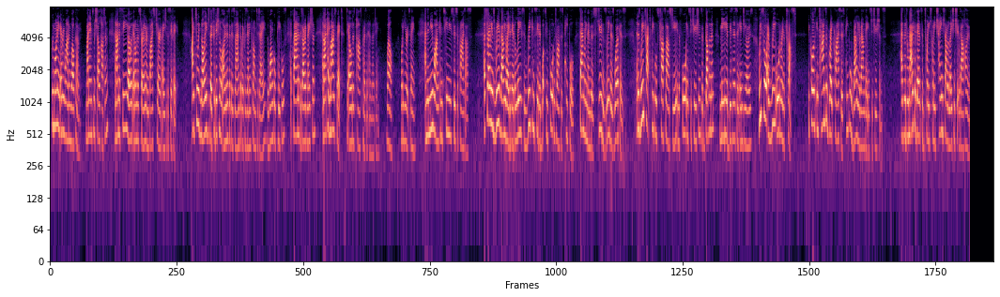

SCM2_1 - audio     -->  (948857,)
SCM2_1 - stft      -->  (1025, 12652)
SCM2_1 - S         -->  (1025, 12652)
SCM2_1 - energy    -->  (128, 1864)
SCM2_1 - rms       -->  (1, 1864)
SCM2_1 - mfcc      -->  (15, 1864)
SCM2_1 - dmfcc     -->  (15, 1864)
SCM2_1 - ddmfcc    -->  (15, 1864)
SCM2_1 - contrast  -->  (7, 1864)
SCM2_1 - centroid  -->  (1, 1864)


SCM2_1 



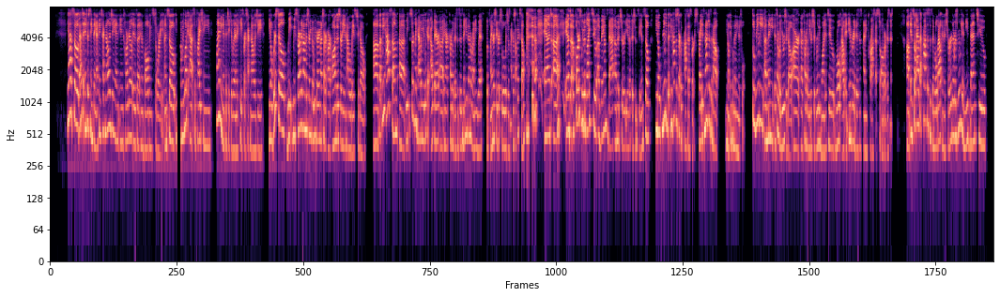

SCM_1 - audio     -->  (938008,)
SCM_1 - stft      -->  (1025, 12507)
SCM_1 - S         -->  (1025, 12507)
SCM_1 - energy    -->  (128, 1864)
SCM_1 - rms       -->  (1, 1864)
SCM_1 - mfcc      -->  (15, 1864)
SCM_1 - dmfcc     -->  (15, 1864)
SCM_1 - ddmfcc    -->  (15, 1864)
SCM_1 - contrast  -->  (7, 1864)
SCM_1 - centroid  -->  (1, 1864)


SCM_1 



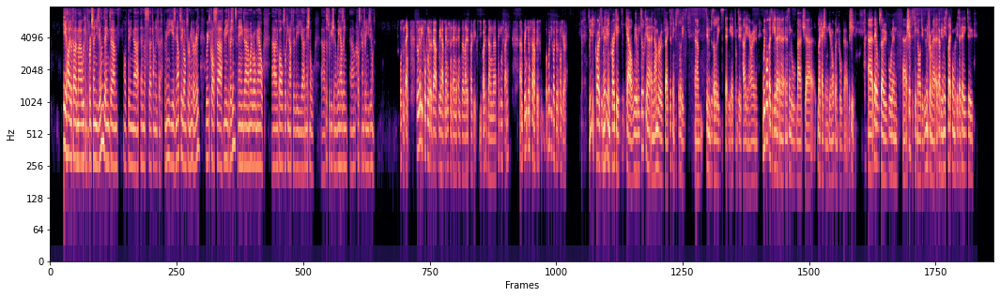

edelman_5 - audio     -->  (890491,)
edelman_5 - stft      -->  (1025, 11874)
edelman_5 - S         -->  (1025, 11874)
edelman_5 - energy    -->  (128, 1864)
edelman_5 - rms       -->  (1, 1864)
edelman_5 - mfcc      -->  (15, 1864)
edelman_5 - dmfcc     -->  (15, 1864)
edelman_5 - ddmfcc    -->  (15, 1864)
edelman_5 - contrast  -->  (7, 1864)
edelman_5 - centroid  -->  (1, 1864)


edelman_5 



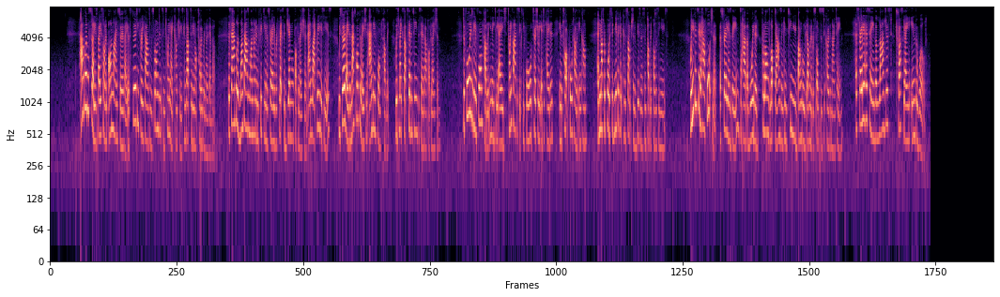

SCM2_2 - audio     -->  (886904,)
SCM2_2 - stft      -->  (1025, 11826)
SCM2_2 - S         -->  (1025, 11826)
SCM2_2 - energy    -->  (128, 1864)
SCM2_2 - rms       -->  (1, 1864)
SCM2_2 - mfcc      -->  (15, 1864)
SCM2_2 - dmfcc     -->  (15, 1864)
SCM2_2 - ddmfcc    -->  (15, 1864)
SCM2_2 - contrast  -->  (7, 1864)
SCM2_2 - centroid  -->  (1, 1864)


SCM2_2 



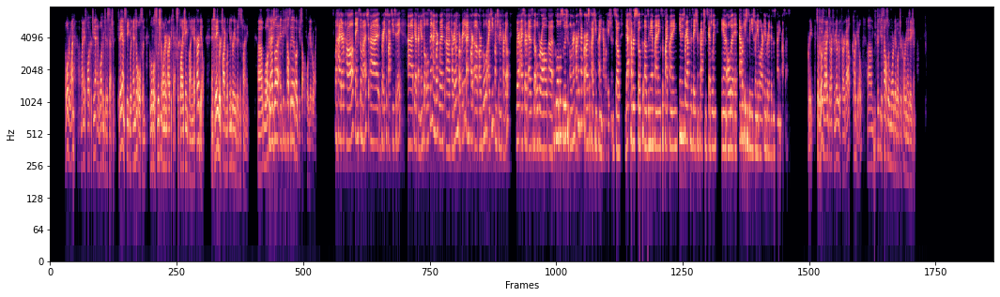

SCM_2 - audio     -->  (913154,)
SCM_2 - stft      -->  (1025, 12176)
SCM_2 - S         -->  (1025, 12176)
SCM_2 - energy    -->  (128, 1864)
SCM_2 - rms       -->  (1, 1864)
SCM_2 - mfcc      -->  (15, 1864)
SCM_2 - dmfcc     -->  (15, 1864)
SCM_2 - ddmfcc    -->  (15, 1864)
SCM_2 - contrast  -->  (7, 1864)
SCM_2 - centroid  -->  (1, 1864)


SCM_2 



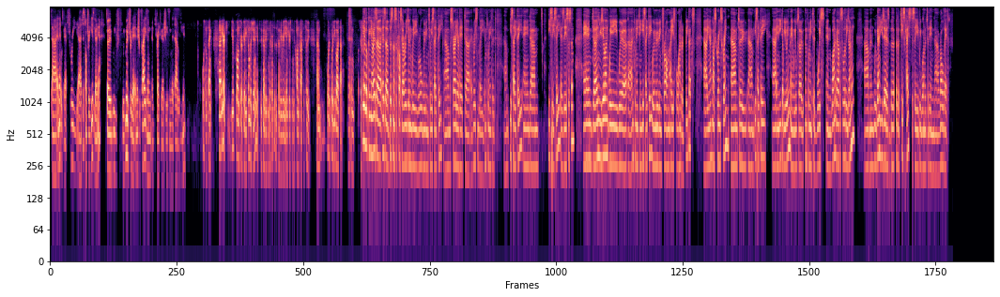

edelman_2(music) - audio     -->  (733988,)
edelman_2(music) - stft      -->  (1025, 9787)
edelman_2(music) - S         -->  (1025, 9787)
edelman_2(music) - energy    -->  (128, 1864)
edelman_2(music) - rms       -->  (1, 1864)
edelman_2(music) - mfcc      -->  (15, 1864)
edelman_2(music) - dmfcc     -->  (15, 1864)
edelman_2(music) - ddmfcc    -->  (15, 1864)
edelman_2(music) - contrast  -->  (7, 1864)
edelman_2(music) - centroid  -->  (1, 1864)


edelman_2(music) 



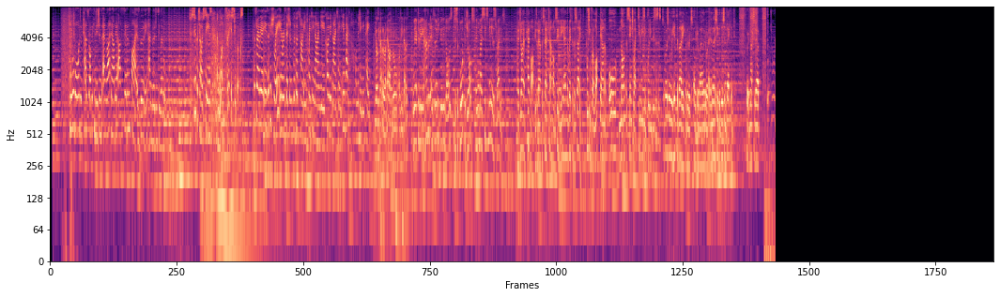

edelman_1 - audio     -->  (927802,)
edelman_1 - stft      -->  (1025, 12371)
edelman_1 - S         -->  (1025, 12371)
edelman_1 - energy    -->  (128, 1864)
edelman_1 - rms       -->  (1, 1864)
edelman_1 - mfcc      -->  (15, 1864)
edelman_1 - dmfcc     -->  (15, 1864)
edelman_1 - ddmfcc    -->  (15, 1864)
edelman_1 - contrast  -->  (7, 1864)
edelman_1 - centroid  -->  (1, 1864)


edelman_1 



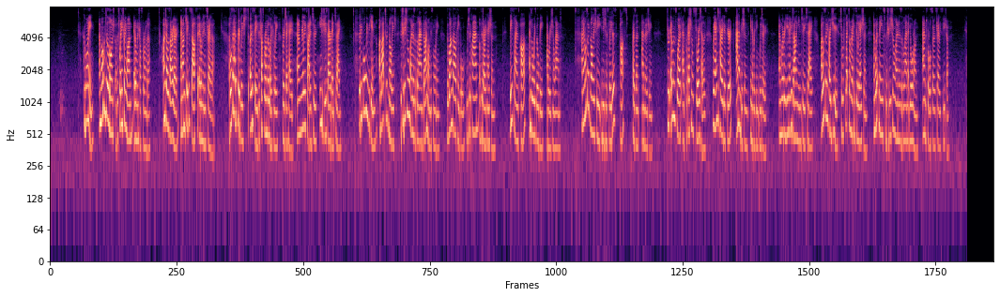

edelman_3(music) - audio     -->  (912878,)
edelman_3(music) - stft      -->  (1025, 12172)
edelman_3(music) - S         -->  (1025, 12172)
edelman_3(music) - energy    -->  (128, 1864)
edelman_3(music) - rms       -->  (1, 1864)
edelman_3(music) - mfcc      -->  (15, 1864)
edelman_3(music) - dmfcc     -->  (15, 1864)
edelman_3(music) - ddmfcc    -->  (15, 1864)
edelman_3(music) - contrast  -->  (7, 1864)
edelman_3(music) - centroid  -->  (1, 1864)


edelman_3(music) 



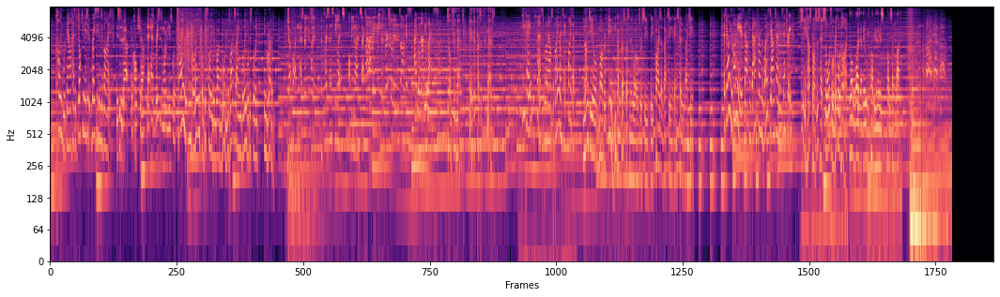

brad_1 - audio     -->  (540650,)
brad_1 - stft      -->  (1025, 7209)
brad_1 - S         -->  (1025, 7209)
brad_1 - energy    -->  (128, 1864)
brad_1 - rms       -->  (1, 1864)
brad_1 - mfcc      -->  (15, 1864)
brad_1 - dmfcc     -->  (15, 1864)
brad_1 - ddmfcc    -->  (15, 1864)
brad_1 - contrast  -->  (7, 1864)
brad_1 - centroid  -->  (1, 1864)


brad_1 



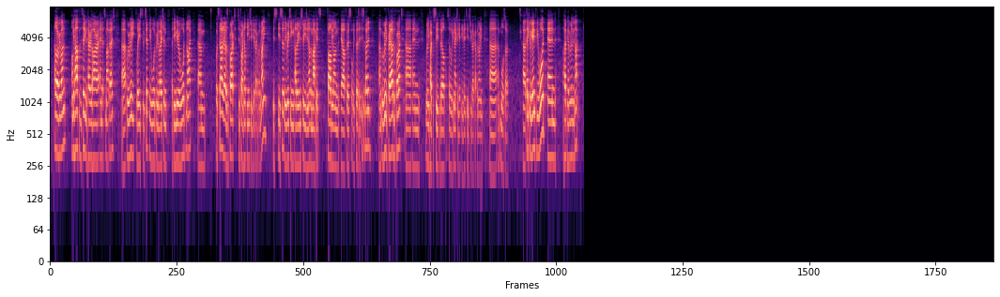

iconic_1 - audio     -->  (951867,)
iconic_1 - stft      -->  (1025, 12692)
iconic_1 - S         -->  (1025, 12692)
iconic_1 - energy    -->  (128, 1864)
iconic_1 - rms       -->  (1, 1864)
iconic_1 - mfcc      -->  (15, 1864)
iconic_1 - dmfcc     -->  (15, 1864)
iconic_1 - ddmfcc    -->  (15, 1864)
iconic_1 - contrast  -->  (7, 1864)
iconic_1 - centroid  -->  (1, 1864)


iconic_1 



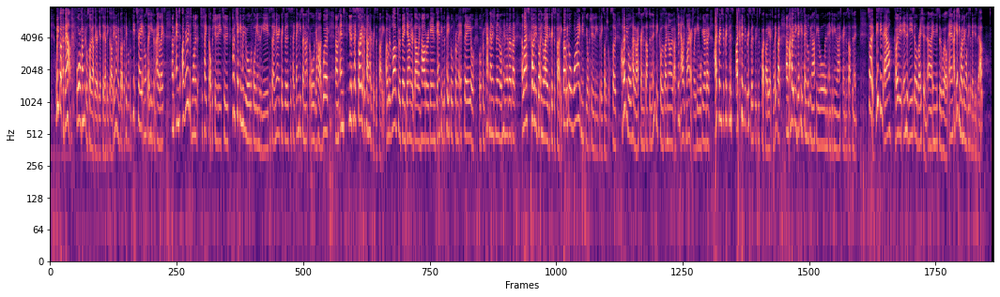

geoff_1 - audio     -->  (953934,)
geoff_1 - stft      -->  (1025, 12720)
geoff_1 - S         -->  (1025, 12720)
geoff_1 - energy    -->  (128, 1864)
geoff_1 - rms       -->  (1, 1864)
geoff_1 - mfcc      -->  (15, 1864)
geoff_1 - dmfcc     -->  (15, 1864)
geoff_1 - ddmfcc    -->  (15, 1864)
geoff_1 - contrast  -->  (7, 1864)
geoff_1 - centroid  -->  (1, 1864)


geoff_1 



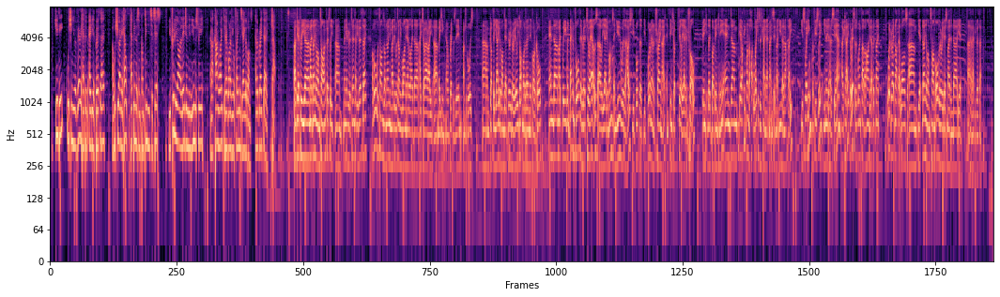

In [9]:
#Pad Arrays
arrays = ['stft','S','energy','rms','mfcc','dmfcc','ddmfcc','contrast','centroid']
target = list(max_len.values())[0]

for file in filenames:
    d= globals()[file]
    for array in arrays:
        globals()[file][array] = capstone.utils.array_pad(d[array],target)
    capstone.utils.print_shape(file,d)
    capstone.audio.spec_plotter(d, file, plot=feature,sr=d['sr'], save=True)

### Import Labels

In [10]:
#load file list
label_list = [os.path.join(sources,fname) for fname in
               os.listdir(sources) if fname.endswith('.txt')] 
label_dict = {}
for x in range(len(label_list)):
    label_dict[f"{label_list[x].split('/')[4].split('.')[0]}"] = label_list[x]  

In [11]:
#get labes into dataframes
for file in filenames:
    globals()[f'{file}_df'] = pd.read_csv(label_dict[file], sep='\t', header=None)
    globals()[f'{file}_df'].sort_values(by=[0],ignore_index=True,inplace=True)
    print(f'Generated: {file}_df')

Generated: edelman_4_df
Generated: SCM2_1_df
Generated: SCM_1_df
Generated: edelman_5_df
Generated: SCM2_2_df
Generated: SCM_2_df
Generated: edelman_2(music)_df
Generated: edelman_1_df
Generated: edelman_3(music)_df
Generated: brad_1_df
Generated: iconic_1_df
Generated: geoff_1_df


In [12]:
#Transform time<>frames<>samples
frame_ratio = target / librosa.frames_to_time(target, sr=16000, hop_length=512, n_fft=2048)
sample_ratio = librosa.frames_to_samples(target, hop_length=512, n_fft=2048) /target

In [13]:
#expand labels
for file in filenames:
    df=globals()[f'{file}_df']
    globals()[f'{file}_labels'] = capstone.utils.label_expander('frame',df, frame_ratio)
    print(f'Generated: {file}_labels')

Generated: edelman_4_labels
Generated: SCM2_1_labels
Generated: SCM_1_labels
Generated: edelman_5_labels
Generated: SCM2_2_labels
Generated: SCM_2_labels
Generated: edelman_2(music)_labels
Generated: edelman_1_labels
Generated: edelman_3(music)_labels
Generated: brad_1_labels
Generated: iconic_1_labels
Generated: geoff_1_labels


edelman_4


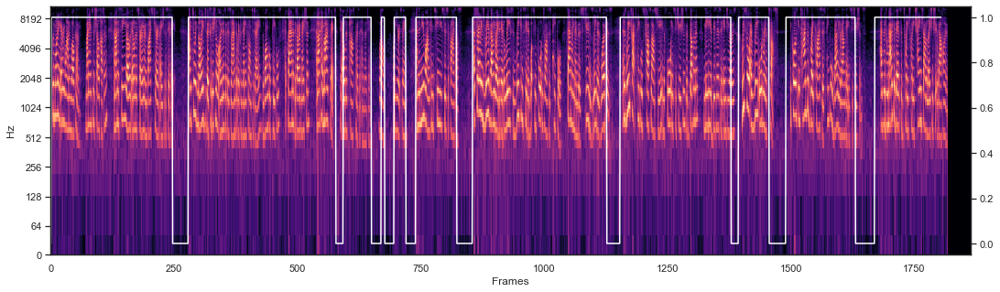

SCM2_1


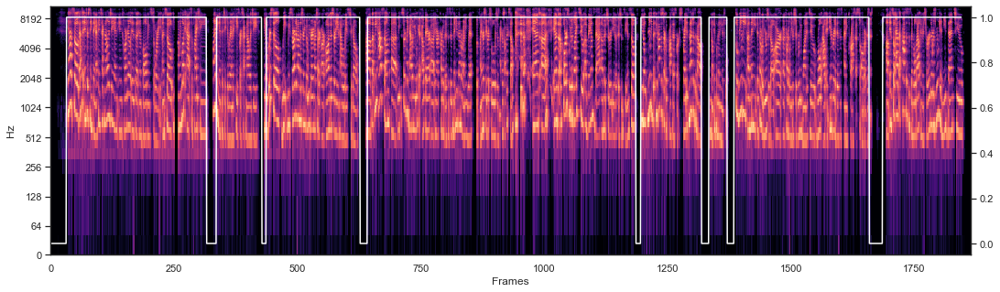

SCM_1


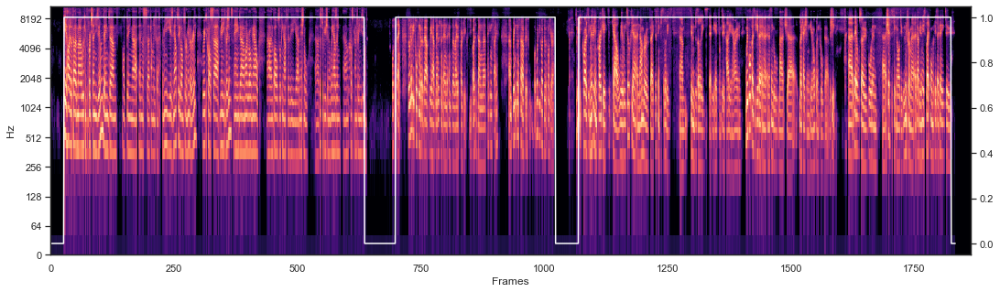

edelman_5


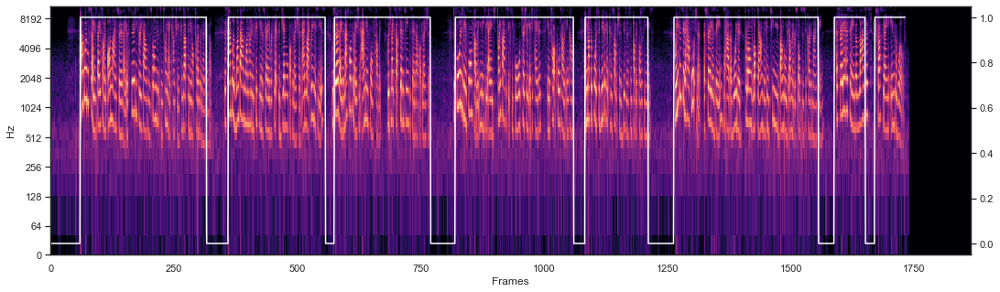

SCM2_2


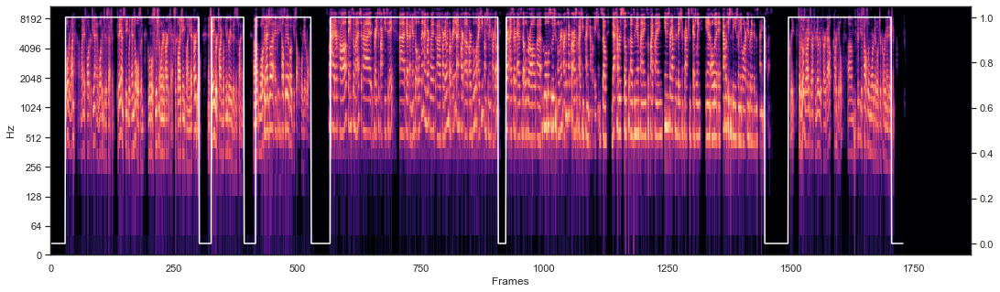

SCM_2


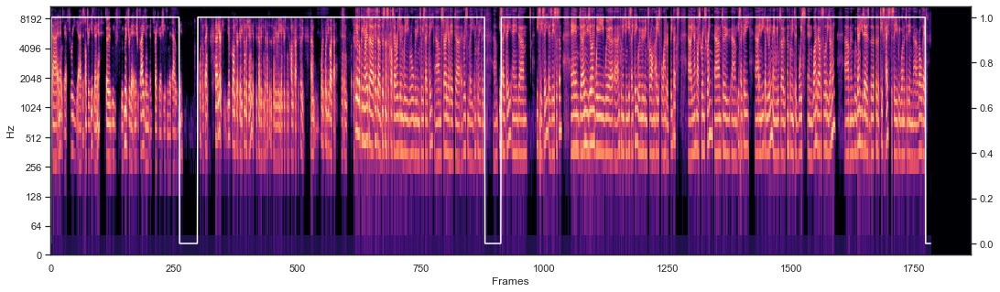

edelman_2(music)


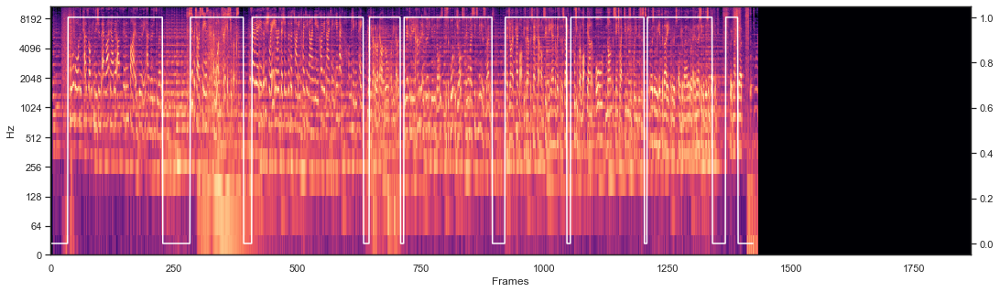

edelman_1


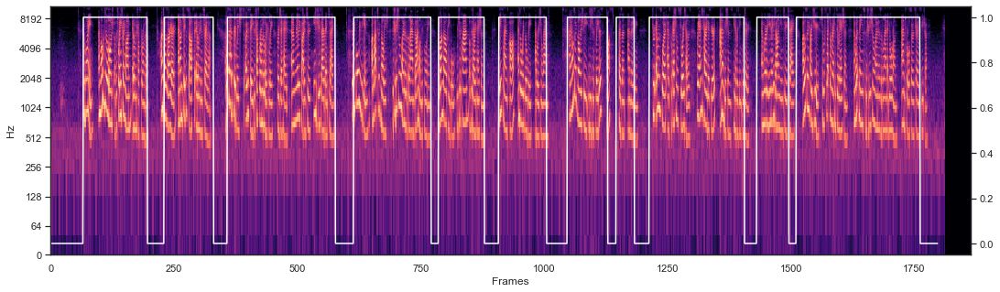

edelman_3(music)


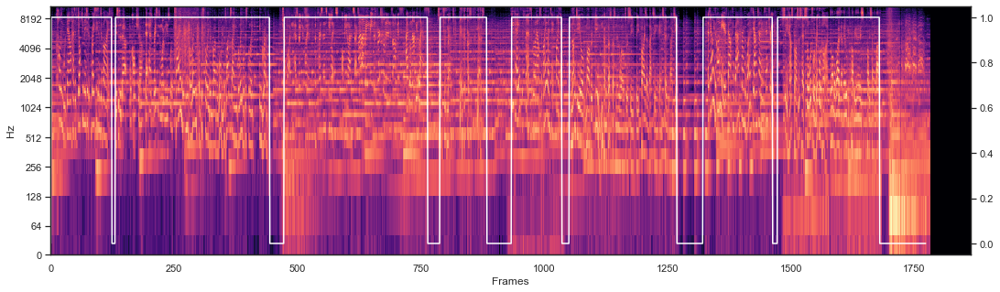

brad_1


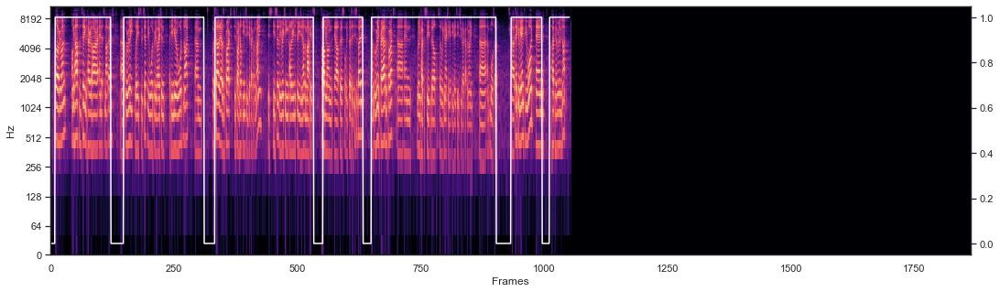

iconic_1


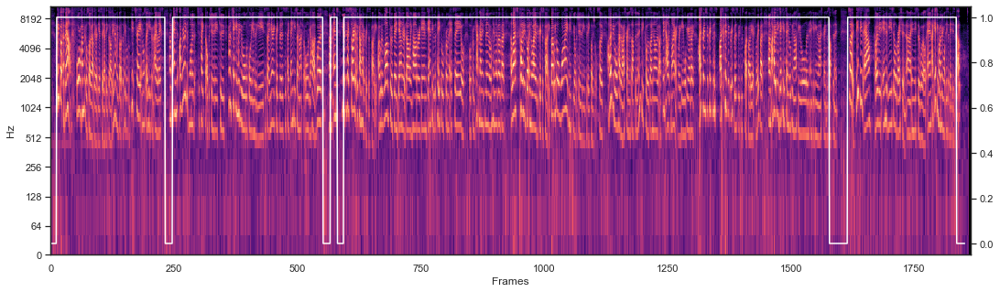

geoff_1


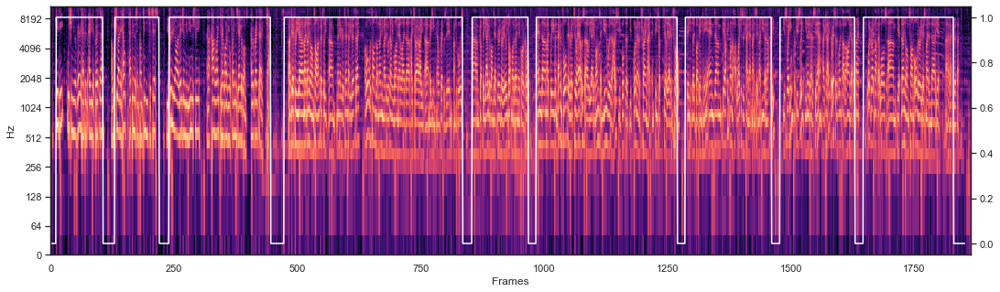

In [14]:
#spectrogram view
feature = 'energy'
out_path= 'data/VAD/training_set/1m_snippets/'
suffix = '_masked'
for file in filenames:
    #prep 
    df = globals()[file]
    label_df = globals()[f'{file}_labels']
    #exec
    capstone.audio.mask_plotter(df[feature],label_df, filename=file, save=True,
                                out_path=out_path, suffix=suffix)

In [15]:
edelman_5_df

,0,1,2,frame_in,frame_out
0,0.000,1.894000,0,0,59
1,1.894,10.136000,1,60,316
2,10.136,11.274000,0,317,361
3,11.274,17.626000,1,362,559
4,17.626,18.234000,0,560,578
5,18.234,24.496000,1,579,774
6,24.496,26.134000,0,775,825
7,26.134,33.856000,1,826,1066
8,33.856,34.624000,0,1067,1090
9,34.624,38.776000,1,1091,1219


geoff_1


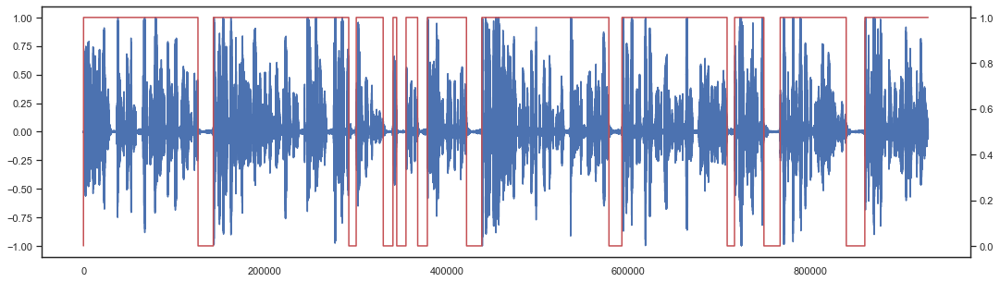

CPU times: user 1.47 s, sys: 170 ms, total: 1.64 s
Wall time: 1.41 s


In [16]:
#plot waveform with labels as mask
%%time
out_path = 'data/VAD/training_set/1m_snippets/'
suffix= '_wave'
filename = 'edelman_4'

dff = capstone.utils.label_expander('sample',edelman_4_df,sample_ratio, i='frame_in',o='frame_out', error=-9)
capstone.audio.mask_plotter(edelman_4['audio'],dff,filename=file,
             save=True,wave=True, out_path=out_path, suffix=suffix, mask_color='r')

### Apply labels to feature df

In [17]:
#convert to df with labels
for file in filenames:
    feature = 'energy'
    file_df = globals()[file]
    label_df = globals()[f'{file}_labels']
    
    globals()[f'{file}_{feature}_Xtr'],\
    globals()[f'{file}_{feature}_ytr'] = \
        capstone.utils.label_apply(file, file_df, feature, label_df)
    
    print(f'{file}_{feature}_Xtr')

(1864, 128) (1864,)
edelman_4_energy_Xtr
(1864, 128) (1864,)
SCM2_1_energy_Xtr
(1864, 128) (1864,)
SCM_1_energy_Xtr
(1864, 128) (1864,)
edelman_5_energy_Xtr
(1864, 128) (1864,)
SCM2_2_energy_Xtr
(1864, 128) (1864,)
SCM_2_energy_Xtr
(1864, 128) (1864,)
edelman_2(music)_energy_Xtr
(1864, 128) (1864,)
edelman_1_energy_Xtr
(1864, 128) (1864,)
edelman_3(music)_energy_Xtr
(1864, 128) (1864,)
brad_1_energy_Xtr
(1864, 128) (1864,)
iconic_1_energy_Xtr
(1864, 128) (1864,)
geoff_1_energy_Xtr


#### Concatenate DFs into one and conform training X/y

In [18]:
X_train = pd.DataFrame()
y_train = pd.DataFrame()
for file in filenames:
    dfX_sub = globals()[f'{file}_energy_Xtr']
    dfy_sub = globals()[f'{file}_energy_ytr']
    X_train = pd.concat((X_train,dfX_sub), ignore_index=True)
    y_train = pd.concat((y_train,dfy_sub), ignore_index=True)
    y_train = y_train.astype(int)
print(X_train.shape, y_train.shape)

(22368, 128) (22368, 1)


In [19]:
X_train = X_train.to_numpy()
y_train = y_train.to_numpy()

## Prepare Testing Data

In [20]:
#Load sources
sources = 'data/VAD/testing_set/'
path = 'data/VAD/testing_set/'
cwd = '/'.join(path.split('/')[0:4])
test_path_list = [os.path.join(sources,fname) for fname in
               os.listdir(sources) if fname.endswith('.wav')] 

#dictionary gen
test_file_dict = {}
for x in range(len(test_path_list)):
    test_file_dict[f"{test_path_list[x].split('/')[3].split('.')[0]}"] = test_path_list[x]
    
#filename list gen
test_filenames = list(test_file_dict.keys())
print(test_filenames)

#list label files
test_label_list = [os.path.join(sources,fname) for fname in
               os.listdir(sources) if fname.endswith('.txt')]

#dictionarise label list
test_label_dict = {}
for x in range(len(test_label_list)):
    test_label_dict[f"{test_label_list[x].split('/')[3].split('.')[0]}"] = test_label_list[x]  

#loading labels
for file in test_filenames:
    globals()[f'{file}_test_df'] = pd.read_csv(test_label_dict[file], sep='\t', header=None)
    globals()[f'{file}_test_df'].sort_values(by=[0],ignore_index=True,inplace=True)
    print(f'Generated: {file}_test_df')

['edelman_7', 'edelman_6', 'iconic_2', 'geoff_2']
Generated: edelman_7_test_df
Generated: edelman_6_test_df
Generated: iconic_2_test_df
Generated: geoff_2_test_df


In [21]:
#extract features
for file in test_filenames:
    globals()[f'{file}'] = capstone.audio.feat_ext(test_file_dict[file], sr=16000)
    globals()[f'{file}']['path'] = test_file_dict[file]
    #capstone.utils.print_shape(file,globals()[f'{file}'])

In [22]:
#Find Max Length
test_lengths = {}
for file in test_filenames:
    test_lengths[file] = len(globals()[file]['energy'][0])
    
test_max_len = max(list(test_lengths.values()))
test_max_len = {list(test_lengths.keys())[list(test_lengths.values()).index(test_max_len)]:test_max_len}
test_max_len

{'iconic_2': 1876}

edelman_7 - audio     -->  (880541,)
edelman_7 - stft      -->  (1025, 11741)
edelman_7 - S         -->  (1025, 11741)
edelman_7 - energy    -->  (128, 1876)
edelman_7 - rms       -->  (1, 1876)
edelman_7 - mfcc      -->  (15, 1876)
edelman_7 - dmfcc     -->  (15, 1876)
edelman_7 - ddmfcc    -->  (15, 1876)
edelman_7 - contrast  -->  (7, 1876)
edelman_7 - centroid  -->  (1, 1876)


edelman_7 



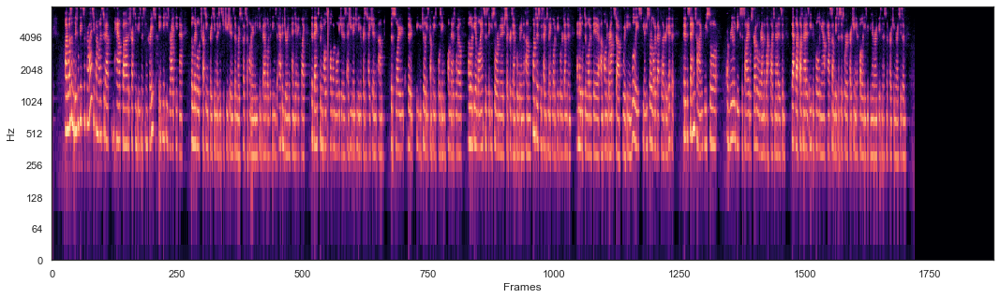

edelman_6 - audio     -->  (905416,)
edelman_6 - stft      -->  (1025, 12073)
edelman_6 - S         -->  (1025, 12073)
edelman_6 - energy    -->  (128, 1876)
edelman_6 - rms       -->  (1, 1876)
edelman_6 - mfcc      -->  (15, 1876)
edelman_6 - dmfcc     -->  (15, 1876)
edelman_6 - ddmfcc    -->  (15, 1876)
edelman_6 - contrast  -->  (7, 1876)
edelman_6 - centroid  -->  (1, 1876)


edelman_6 



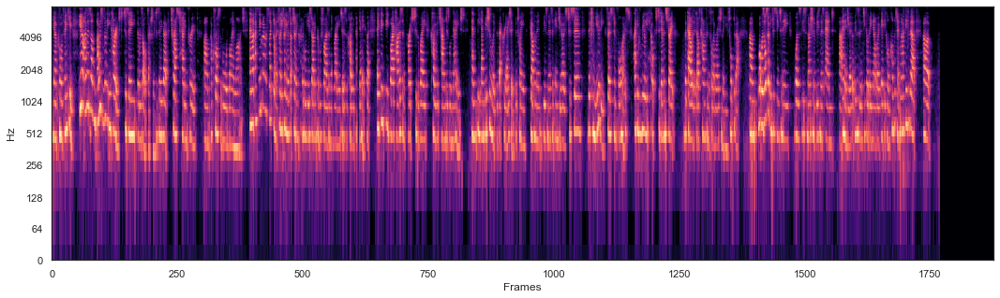

iconic_2 - audio     -->  (960154,)
iconic_2 - stft      -->  (1025, 12803)
iconic_2 - S         -->  (1025, 12803)
iconic_2 - energy    -->  (128, 1876)
iconic_2 - rms       -->  (1, 1876)
iconic_2 - mfcc      -->  (15, 1876)
iconic_2 - dmfcc     -->  (15, 1876)
iconic_2 - ddmfcc    -->  (15, 1876)
iconic_2 - contrast  -->  (7, 1876)
iconic_2 - centroid  -->  (1, 1876)


iconic_2 



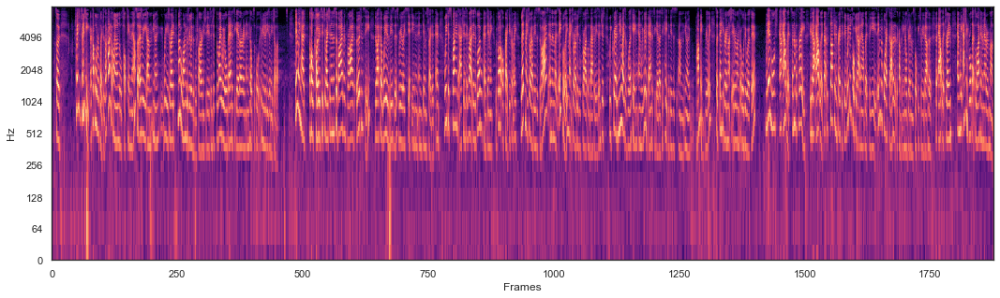

geoff_2 - audio     -->  (938935,)
geoff_2 - stft      -->  (1025, 12520)
geoff_2 - S         -->  (1025, 12520)
geoff_2 - energy    -->  (128, 1876)
geoff_2 - rms       -->  (1, 1876)
geoff_2 - mfcc      -->  (15, 1876)
geoff_2 - dmfcc     -->  (15, 1876)
geoff_2 - ddmfcc    -->  (15, 1876)
geoff_2 - contrast  -->  (7, 1876)
geoff_2 - centroid  -->  (1, 1876)


geoff_2 



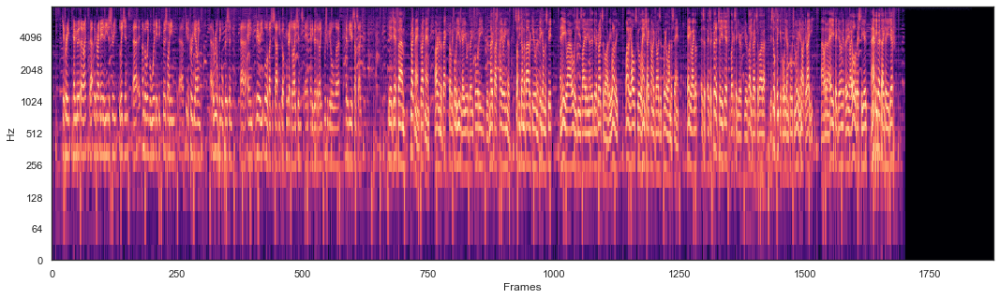

In [23]:
#array padding
arrays = ['stft','S','energy','rms','mfcc','dmfcc','ddmfcc','contrast','centroid']
target = list(test_max_len.values())[0]

for file in test_filenames:
    d= globals()[file]
    for array in arrays:
        globals()[file][array] = capstone.utils.array_pad(d[array],target)
    capstone.utils.print_shape(file,d)
    capstone.audio.spec_plotter(d, file, plot='energy',sr=d['sr'], save=True)

In [24]:
for file in test_filenames:
    #expand labels
    df=globals()[f'{file}_test_df']
    globals()[f'{file}_test_labels'] = capstone.utils.label_expander('frame',df, frame_ratio)
    globals()[f'{file}_test_labels'] = globals()[f'{file}_test_labels'].astype(int)
    print(f'Generated: {file}_test_labels')

Generated: edelman_7_test_labels
Generated: edelman_6_test_labels
Generated: iconic_2_test_labels
Generated: geoff_2_test_labels


In [25]:
#apply labels
for file in test_filenames:
    feature = 'energy'
    test_file_df = globals()[file]
    test_label_df = globals()[f'{file}_test_labels']
    
    globals()[f'{file}_{feature}_Xte'],\
    globals()[f'{file}_{feature}_yte'] = \
        capstone.utils.label_apply(file, test_file_df, feature, test_label_df)
    
    print(f'{file}_{feature}_Xte , ',f'{file}_{feature}_yte')

(1876, 128) (1876,)
edelman_7_energy_Xte ,  edelman_7_energy_yte
(1876, 128) (1876,)
edelman_6_energy_Xte ,  edelman_6_energy_yte
(1876, 128) (1876,)
iconic_2_energy_Xte ,  iconic_2_energy_yte
(1876, 128) (1876,)
geoff_2_energy_Xte ,  geoff_2_energy_yte


In [26]:
#combine on one DF
X_test = pd.DataFrame()
y_test = pd.DataFrame()
for file in test_filenames:
    dfX_sub = globals()[f'{file}_{feature}_Xte']
    dfy_sub = globals()[f'{file}_{feature}_yte']
    X_test = pd.concat((X_test,dfX_sub), ignore_index=True)
    y_test = pd.concat((y_test,dfy_sub), ignore_index=True)
    y_test = y_test.astype(int)
print(X_test.shape, y_test.shape)

(7504, 128) (7504, 1)


## Define and Train/Test Models

In [27]:
clf1 = SVC(C=5, probability=True)
clf2 = SVC(C=10, probability=True)
clf3 = RandomForestClassifier(n_estimators=5, max_depth=5, random_state=42)
clf4 = RandomForestClassifier(n_estimators=5, max_depth=10, random_state=42)
clf5 = RandomForestClassifier(n_estimators=10, max_depth=5, random_state=42)
clf6 = RandomForestClassifier(n_estimators=10, max_depth=10, random_state=42)

In [28]:
#Parametrisation
train_params = {
    'sub_folder_level':4,
    'plot_save':True,
    'figsize':[10,5],
    'pickle':True
}
test_params={}
test_params.update(train_params)
test_params['pickle']=False

dataset = (X_train,y_train.ravel(),X_test,y_test)

Directory created: output/VAD/SVC5
Directory created: output/VAD/SVC5/train
Directory created: output/VAD/SVC5/test
CPU times: user 4min 1s, sys: 2.35 s, total: 4min 4s
Wall time: 4min 4s


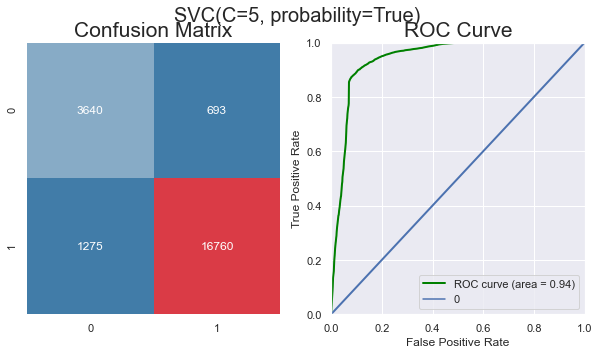

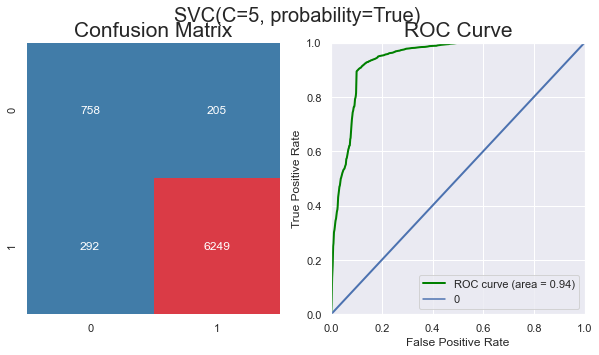

In [106]:
%%time
name, model = ('SVC5',clf1)
SVC5 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

Directory created: output/VAD/SVC10/train
Directory created: output/VAD/SVC10/test
CPU times: user 3min 52s, sys: 2.56 s, total: 3min 55s
Wall time: 3min 56s


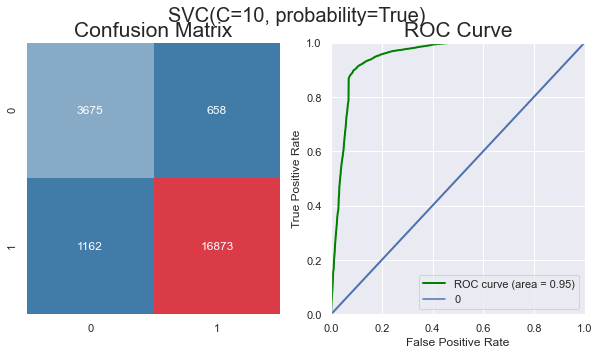

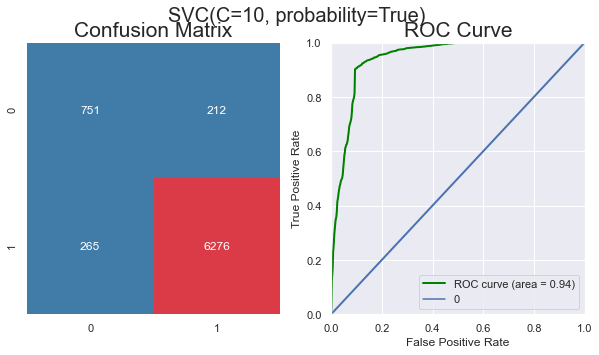

In [107]:
%%time
name, model = ('SVC10',clf2)
SVC10 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

CPU times: user 14.1 s, sys: 273 ms, total: 14.4 s
Wall time: 14.1 s


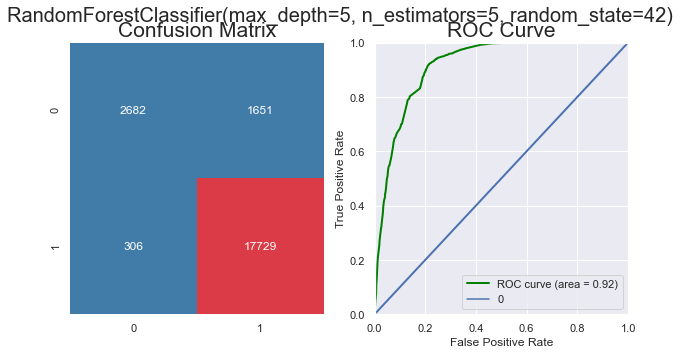

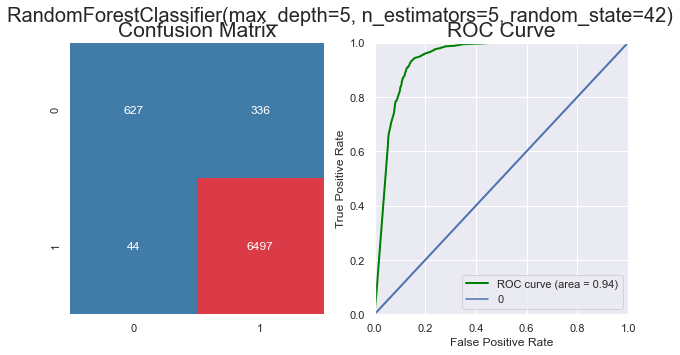

In [101]:
%%time
name, model = ('RF55',clf3)
RF55 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

Directory created: output/VAD/RF510
Directory created: output/VAD/RF510/train
Directory created: output/VAD/RF510/test
CPU times: user 19 s, sys: 151 ms, total: 19.2 s
Wall time: 18.7 s


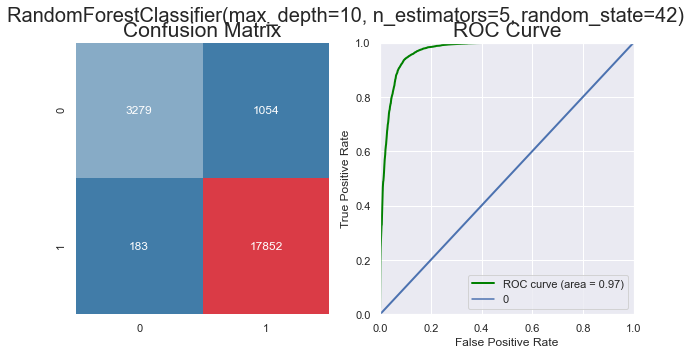

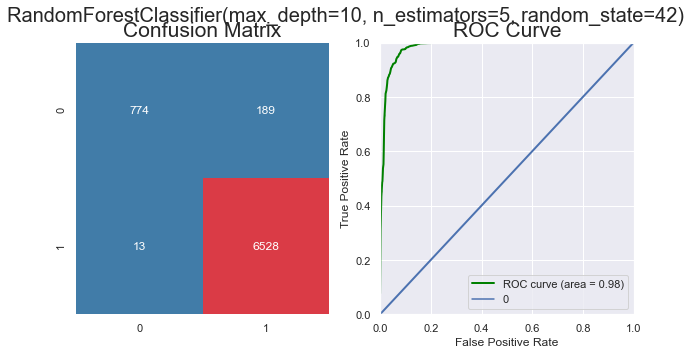

In [102]:
%%time
name, model = ('RF510',clf4)
RF510 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

Directory created: output/VAD/RF105
Directory created: output/VAD/RF105/train
Directory created: output/VAD/RF105/test
CPU times: user 25.4 s, sys: 278 ms, total: 25.7 s
Wall time: 25.3 s


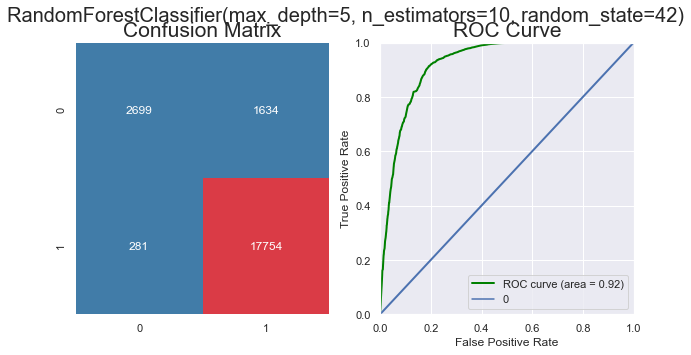

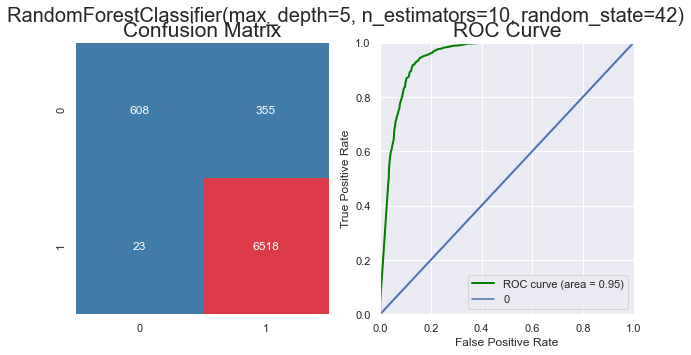

In [103]:
%%time
name, model = ('RF105',clf5)
RF105 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

CPU times: user 21.5 s, sys: 274 ms, total: 21.8 s
Wall time: 21.5 s


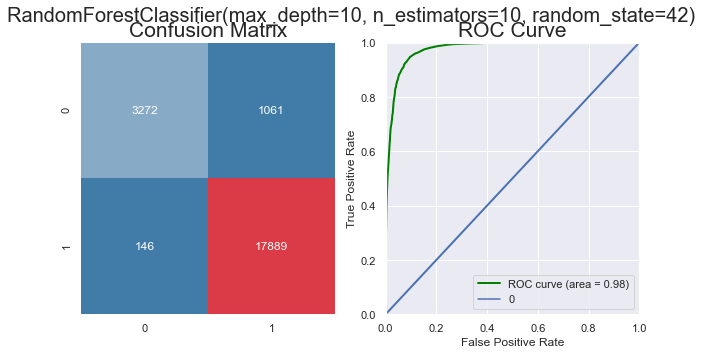

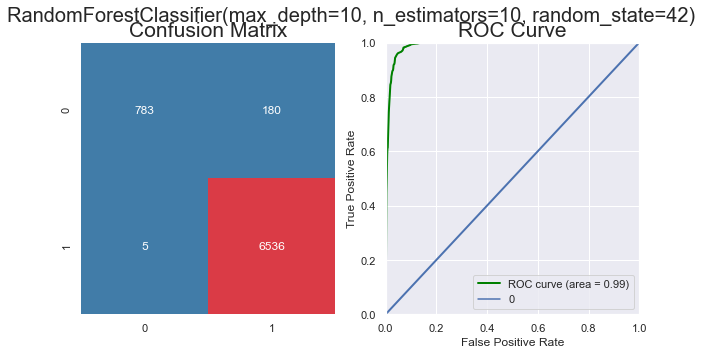

In [104]:
%%time
name, model = ('RF1010',clf6)
RF1010 = sktools.modelling.dual_mono(name,model,*dataset,train_params,test_params)

In [109]:
mds = [SVC5,SVC10,RF55,RF510,RF105,RF1010]

for x in mds:
    print(x['train']['fitted'],x['train']['score'],x['test']['score'])

SVC(C=5, probability=True) 0.9120171673819742 0.933768656716418
SVC(C=10, probability=True) 0.9186337625178826 0.9364339019189766
RandomForestClassifier(max_depth=5, n_estimators=5, random_state=42) 0.9125089413447782 0.9493603411513859
RandomForestClassifier(max_depth=10, n_estimators=5, random_state=42) 0.944697782546495 0.9730810234541578
RandomForestClassifier(max_depth=5, n_estimators=10, random_state=42) 0.9143866237482118 0.9496268656716418
RandomForestClassifier(max_depth=10, n_estimators=10, random_state=42) 0.9460389842632332 0.9753464818763327


## Obtain predictions by file

### SVC5

In [110]:
for file in test_filenames:
    X_tt=globals()[f'{file}_{feature}_Xte']
    y_tt=globals()[f'{file}_{feature}_yte']
    globals()[f'{file}_{feature}_score'] = clf1.score(X_tt,y_tt)
    globals()[f'{file}_{feature}_preds'] = clf1.predict(X_tt)
    print(file, globals()[f'{file}_{feature}_score'])

edelman_7 0.9381663113006397
edelman_6 0.9333688699360341
iconic_2 0.9616204690831557
geoff_2 0.9019189765458422


## Plot Predictions vs actual SVC5

edelman_7


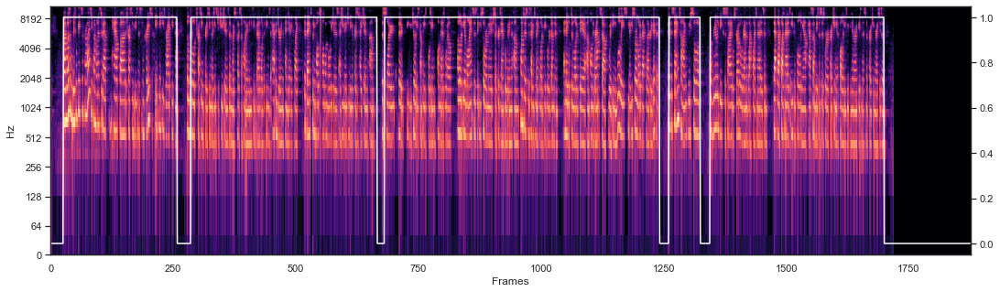

edelman_7


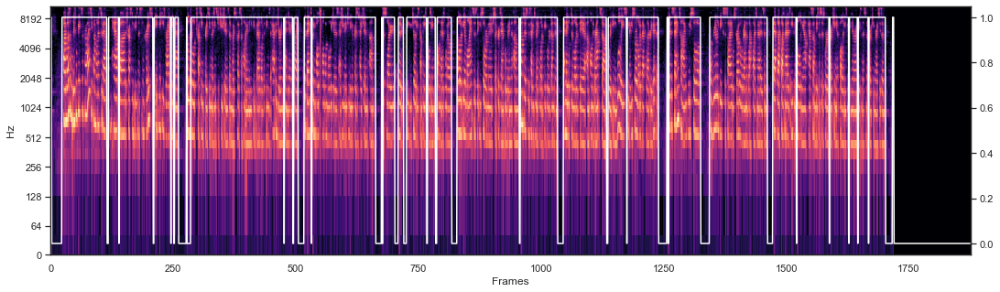

edelman_6


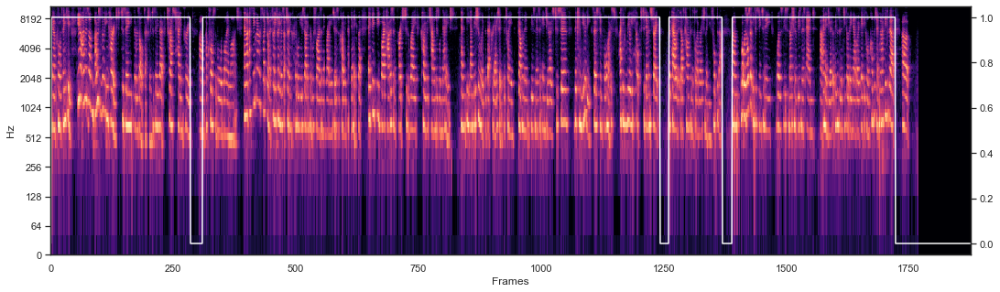

edelman_6


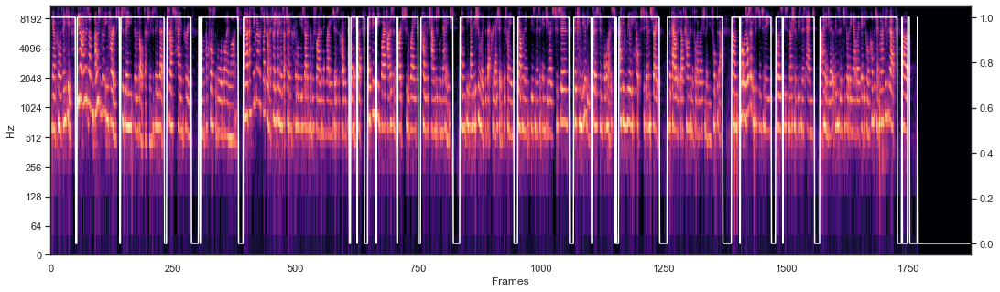

iconic_2


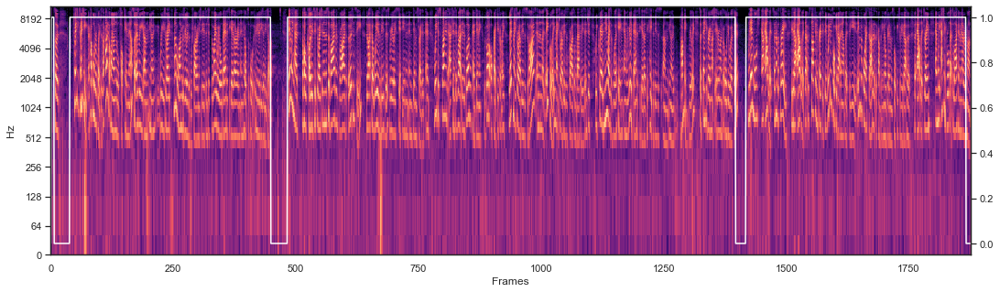

iconic_2


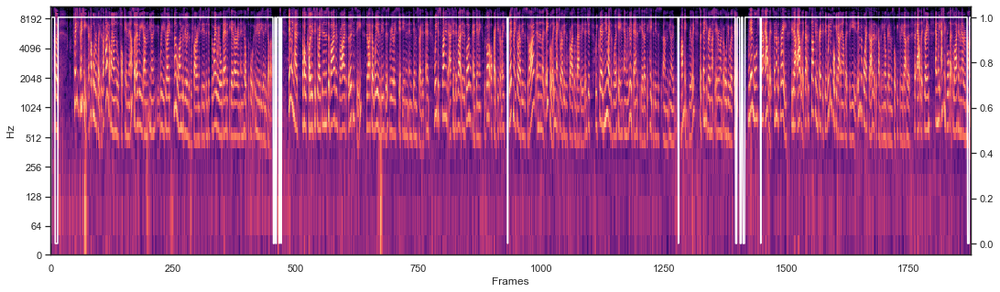

geoff_2


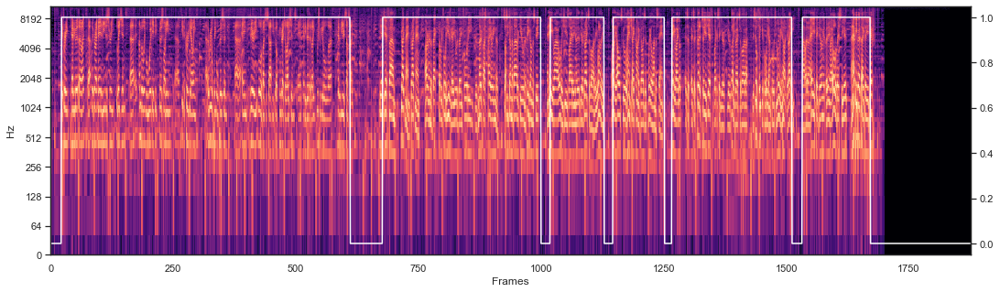

geoff_2


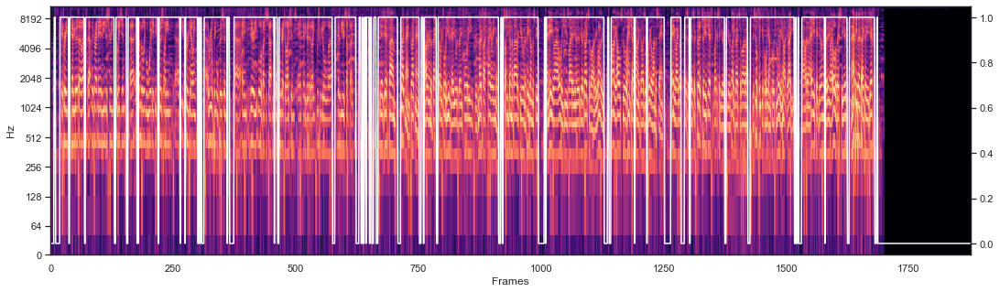

In [111]:
for file in test_filenames[:1]:
    globals()[f'{file}_{feature}_preds']
    
out_path= 'data/VAD/testing_set/'

for file in test_filenames:
    #prep 
    df = globals()[file]
    suffix = '_original_masked'
    label_df = pd.DataFrame(globals()[f'{file}_{feature}_yte'], columns=['l'])
    #exec
    capstone.audio.mask_plotter(df[feature],label_df, filename=file, save=True,
                                out_path=out_path, suffix=suffix)
    #prep 
    df = globals()[file]
    suffix = '_test_masked'
    label_df = pd.DataFrame(globals()[f'{file}_{feature}_preds'], columns=['l'])
    #exec
    capstone.audio.mask_plotter(df[feature],label_df, filename=file, save=True,
                                out_path=out_path, suffix=suffix)

#### Output predictions as csv

In [112]:
out_path= 'data/VAD/testing_set/'
for file in test_filenames:
    pd.DataFrame(globals()[f'{file}_{feature}_preds']).to_csv(out_path+file+'_preds.csv')

>>>